<hr>

**<h1><b> CS437/CS5317/EE414/EE513 Deep Learning | <span style="color: #FFC72C;"> PA4</span></b></h1>**

<hr>

# <span style="color: #FFC72C;">**Submission Guidelines**</span>

- <span style="color: #DA291C;">Please rename the file to `<RollNumber>_PA4_1`.</span>
- <span style="color: #DA291C;">Please also submit a **.py** file of every Notebook. You can do this by exporting your **ipynb** to a Python script.</span>
- <span style="color: #DA291C;">Please submit a zipped folder of both your Jupyter Notebooks and Python script files.</span>

### Name: Muhammad Ahmad 
### Roll Number: 26100398

![Alt Text](mon.jpg)

<h1 style="font-family: 'Impact', sans-serif; color: red; text-transform: uppercase; letter-spacing: 2px; text-align: center;">
    Money Heist: The AI Hostage Crisis (100 Marks) 🎭
</h1>

<p style="font-family: 'Arial', sans-serif; font-size: 16px; text-align: justify;">
The vault is sealed. The alarms are blaring. Outside, the police have surrounded the Royal Mint, waiting for the perfect moment to storm in. But inside, something much bigger is at play.
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 16px; text-align: justify;">
At the heart of the operation lies a <b>money-making machine</b>—a masterpiece of engineering, capable of printing billions. But there’s a catch: it will only operate if a <b>Deep Learning Model achieves over 90% accuracy on a given dataset</b>.
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 16px; text-align: justify;">
The gang has left nothing to chance. A randomizer determines which model must be implemented from scratch. Berlin hovers over the button. He smirks, then presses it. The screen flashes. The room holds its breath.
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 48px; font-weight: bold; text-align: center; color: #FF0000; text-shadow: 3px 3px 5px black;">
    C L I P
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 16px; text-align: justify;">
The Professor’s plan depends on it. The machine won’t work without it. Without the machine, the heist fails. And if the heist fails... so do you.
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 16px; text-align: justify;">
You are not just another hostage. <b>You are the only one who knows how to build this model.</b>
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 16px; text-align: justify;">
The masked figures—Berlin, Tokyo, and the rest of the gang—watch you closely. Their voices cut through the tension:
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 16px;">
🦹‍♂️ <b>Berlin</b>: <i>"You have one shot. No retries. No second chances."</i>  
💀 <b>Tokyo</b>: <i>"If you fail, the plan collapses… and so do you."</i>  
🧠 <b>Professor</b> (through an earpiece): <i>"This is what you were born for. Write the model. Save yourself."</i>
</p>

<h2 style="font-family: 'Impact', sans-serif; color: black; text-transform: uppercase; text-align: center;">
🎯 Your Mission
</h2>

<ul style="font-family: 'Arial', sans-serif; font-size: 16px;">
<li>✅ Implement the <b>custom CLIP model</b> to classify the images based on their descriptions.</li>
<li>✅ Achieve <b>at least 90% accuracy</b>—or the machine stops printing.</li>
<li>✅ <b>One shot. One model. One chance to escape.</b></li>
</ul>

<h2 style="font-family: 'Impact', sans-serif; color: silver; text-transform: uppercase; text-align: center;">
🔥 <b>Are you ready to outsmart the system and break free?</b> The heist begins <b>now.</b>
</h2>

CLIP, developed by OpenAI, is designed to understand and connect textual descriptions with corresponding images. Unlike traditional models that operate within a single modality, CLIP learns to map both text and images into a shared feature space. This shared space enables the model to grasp the relationship between visual content and textual descriptions, making it possible to perform tasks that involve both types of information. For example, CLIP can interpret a sentence and find the image that best matches this description or generate a textual description for a given image.

The ability to learn representations across different modalities opens up new possibilities for tasks that CLIP wasn't explicitly trained for. One of the most intriguing applications is zero-shot classification, where CLIP can classify images into categories it has never seen during training, simply based on the similarity of the image to textual descriptions of those categories. Another powerful feature is the ability to find the closest image match to a query caption, which can be particularly useful for image retrieval and recommendation systems.

By implementing CLIP, we move beyond single-modality tasks and explore the potential of models that understand and integrate multiple forms of information. This approach not only enhances the capabilities of our models but also expands the range of applications they can address, making them more versatile and powerful in handling complex real-world tasks.

Here is a list of resources to help you with this part:
- [CLIP — Intuitively and Exhaustively Explained](https://medium.com/towards-data-science/clip-intuitively-and-exhaustively-explained-1d02c07dbf40) - A good article to get an overview of CLIP.
- [The Annotated CLIP](https://amaarora.github.io/posts/2023-03-06_Understanding_CLIP.html) - A two-part series on a more implementation-focused overview of CLIP.
- [Learning Transferable Visual Models From Natural Language Supervision](https://arxiv.org/abs/2103.00020) - The official CLIP paper

<p style="font-family: 'Arial', sans-serif; font-size: 16px; text-align: justify;">
The system has locked in a <b>default set of libraries</b>—the only tools at your disposal. No exceptions. No upgrades. No external imports.  
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 16px; text-align: justify;">
Tampering with this restriction will trigger an <b>irreversible failure</b>. The system will collapse. The machine will shut down. The heist will fall apart. And so will you.
</p>

<p style="font-family: 'Arial', sans-serif; font-size: 26px; text-align: center; font-weight: bold; color: red;">
⚠️ One wrong move, and it's game over. ⚠️  
</p>

In [17]:
from typing import List, Dict, Callable, Optional
from dataclasses import dataclass
import itertools

import pandas as pd
from PIL import Image

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader

import torchvision
from torchvision import transforms
from torchvision import datasets
import torch.optim as optim
from transformers import get_scheduler

import timm
from transformers import DistilBertModel, DistilBertConfig, DistilBertTokenizer
from tqdm import tqdm

import matplotlib.pyplot as plt
import json
import os

### 🎯 Task 0: The Data Heist  

To crack the code, you need **data**—the blueprint for training your model. The **Flickr8k dataset** holds thousands of images, each paired with descriptions. It's your only shot at teaching CLIP to understand the world.  

🔗 [Download it from Kaggle](https://www.kaggle.com/datasets/adityajn105/flickr8k) before the police trace your signal.  

But beware: **Training CLIP from scratch is like leaving the Royal Mint unscathed: very hard** without massive resources. You’ll work with a **subset**, just enough to power the machine.  

### 🛠️ The System  
- **Text Encoder:** Converts captions into embeddings.  
- **Image Encoder:** Transforms images into a feature space.  
- **Tokenization:** Breaks sentences into numbers the model can read.  

Every word. Every pixel. **Synced perfectly.** One mistake, and the machine fails.  

Below, a **configuration class** defines hyperparameters, and `CLIPDataset` simplifies the chaos. Study it well. **Your survival depends on it.**


In [18]:
@dataclass
class Config:
    images_path: str = "/kaggle/input/flickr8k/Images"  # path to images
    captions_path: str = "/kaggle/input/flickr8k/captions.txt"  # path to captions
    batch_size: int = 32
    epochs: int = 3

    image_encoder: str = 'resnet50'
    image_emb_size: int = 2048
    image_size: int = 224
    image_encoder_lr: float = 1e-4
    
    text_encoder: str = 'distilbert-base-uncased'
    text_embedding: str = 768
    text_tokenizer: str = 'distilbert-base-uncased'
    max_length: int = 200
    text_encoder_lr: float = 1e-5

    projection_dim: int = 256
    head_lr: float = 1e-3
    weight_decay: float = 1e-3

cfg = Config()



In [19]:
class CLIPDataset(Dataset):
    def __init__(
        self, 
        image_filenames: List[str], 
        captions: List[str], 
        tokenizer: Callable[[List[str]], Dict[str, torch.Tensor]], 
        transform: Optional[Callable[[Image.Image], Image.Image]] = None
    ):
        """
        Initializes the dataset with image filenames, captions, a tokenizer function, and optional image transforms.
        
        :param image_filenames: List of image file names.
        :param captions: List of captions corresponding to the images.
        :param tokenizer: Function to tokenize captions. It should return a dictionary with tensors.
        :param transform: Optional transform to be applied on images.
        """
        self.image_filenames = image_filenames
        self.captions = captions
        self.tokenizer = tokenizer
        self.transform = transform

        # Tokenize all captions
        self.encoded_captions = tokenizer(
            captions, padding="max_length", truncation=True, max_length=cfg.max_length, return_tensors="pt"
        )

    def __getitem__(self, idx: int) -> Dict[str, torch.Tensor]:
        """
        Retrieves an item from the dataset given an index.

        :param idx: Index of the item to retrieve.
        :return: Dictionary with 'image', 'input_ids', and 'attention_mask' keys.
        """
        # Get encoded caption
        encoded_caption = {
            "input_ids": self.encoded_captions["input_ids"][idx],
            "attention_mask": self.encoded_captions["attention_mask"][idx]
        }

        # Load and process image
        image_path = f"{cfg.images_path}/{self.image_filenames[idx]}"
        image = Image.open(image_path).convert("RGB")
        
        if self.transform:
            image = self.transform(image)
        
        # Return dictionary with correct keys
        return {
            "image": image,
            "input_ids": encoded_caption["input_ids"],
            "attention_mask": encoded_caption["attention_mask"]
        }
    
    def __len__(self) -> int:
        """
        Returns the number of items in the dataset.

        :return: Number of items.
        """
        return len(self.captions)


# Load dataset and tokenizer
df = pd.read_csv(cfg.captions_path)
print(f"Size of original dataset: {df.shape}")

# Remove duplicate images (keep first occurrence)
df = df.drop_duplicates(subset="image", keep="first")
print(f"Size after deduplication: {df.shape}")

tokenizer = DistilBertTokenizer.from_pretrained(cfg.text_tokenizer)

clip_ds = CLIPDataset(
    image_filenames=df["image"].tolist(),  # Ensure correct list format
    captions=df["caption"].tolist(),
    tokenizer=tokenizer,
    transform=transforms.Compose([
        transforms.Resize((cfg.image_size, cfg.image_size)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
    ])
)

# Dataloader
clip_dl = DataLoader(
    clip_ds,
    batch_size=cfg.batch_size,
    shuffle=True
)

Size of original dataset: (40455, 2)
Size after deduplication: (8091, 2)


### 🖼️ **Task 1: The Image Encoder – Your Only Vision**

The Professor’s voice crackles in your earpiece:  

*"You need eyes inside the system. The Image Encoder is how you see."*  

Your mission? **Transform images into code.** CLIP doesn’t just look at pictures—it **understands them**, mapping them into the same world as words.  

### 🛠 The Tool: ResNet50  
You’ll use `timm` to **extract features** from images. No distractions. No classifier heads. Just raw, powerful vision.  

- **Load the ResNet50 Model** from `timm`, ensuring that it is **pretrained** but without its classification head.  
- **Freeze the model parameters** so that only the projection layers are trained.  
- **Modify the last layers** to output a feature vector of size `d` that matches the text embeddings.  
- **Normalize the image embeddings** so they can be directly compared with text embeddings.

### Final Output Shape
   - Your Image Encoder should return a tensor of shape **$(B, d)$**, where `B` is the batch size and `d` is the embedding dimension.  

### ⚠️ The Risk  
One mistake, and the machine won’t understand the images. **One mistake, and the heist is over.**  

💀 **Berlin**: *"I hope you know what you're doing. If this fails, so do we."*  

🔥 **Your Move:** Implement the Image Encoder. **No second chances.**


In [20]:
class ImageEncoder(nn.Module):
    def __init__(self, 
                 model_name: str,
                 trainable: bool = False):
        super().__init__()
        self.backbone = timm.create_model(model_name, pretrained=True, num_classes=0, global_pool='avg')
        for param in self.backbone.parameters():
            param.requires_grad = trainable
        # self.projection = nn.Linear(self.backbone.num_features, cfg.projection_dim)

    def forward(self, x: torch.Tensor):
        features = self.backbone(x)
        # projected = self.projection(features)
        return F.normalize(features, dim=-1)


In [21]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

img_batch = next(iter(clip_dl))['image']
print(img_batch.shape)

img_encoder = ImageEncoder(model_name=cfg.image_encoder, trainable=False).to(device)
img_batch = img_batch.to(device)
img_enc_out = img_encoder(img_batch)

print(img_enc_out.shape)


torch.Size([32, 3, 224, 224])
torch.Size([32, 2048])


### ✒️ **Task 2: The Text Encoder – Deciphering the Code**

*"Words are just symbols—until you teach the machine to understand them."*  

The Text Encoder is your cryptographer, breaking human language into patterns that can be compared with images. **Your tool of choice?** DistilBERT—fast, lightweight, and just as deadly as its bigger counterpart, BERT.  

### 🔑 The Codebreaker: DistilBERT  
Your mission: **convert words into embeddings** that match the image feature space. But first, you must **tokenize** the language—break it down, strip away the noise, and extract the raw meaning.  

- **Load the Pretrained DistilBERT Model** for efficient text encoding.  
- **Tokenize input text** to prepare it for embedding.  
- **Extract the [CLS] token embedding**—the ultimate summary of the sentence.  
- **Normalize the embeddings** to align with image representations.  


### Final Output Shape
   - Your Text Encoder should return a tensor of shape **$(B, a)$**, where a is the size of the DistilBERT output.  

### ⚠️ The Risk  
Fail here, and CLIP will never understand the connection between words and vision. **Fail here, and you leave the machine blind and deaf.**  

💀 **The Professor:** *"Make every word count. This is the most crucial piece of the puzzle."*  

🔥 **Your Move:** Implement the Text Encoder. **The system is watching.**


In [22]:
from transformers import DistilBertModel

class TextEncoder(nn.Module):
    def __init__(self, model_name: str, trainable: bool = False):
        super().__init__()
        self.transformer = DistilBertModel.from_pretrained(model_name)
        
        if not trainable:
            for param in self.transformer.parameters():
                param.requires_grad = False

    def forward(self, input_ids: torch.Tensor, attention_mask: torch.Tensor):
        outputs = self.transformer(input_ids=input_ids, attention_mask=attention_mask)
        cls_embedding = outputs.last_hidden_state[:, 0]  # Extract [CLS] token
        return F.normalize(cls_embedding, dim=-1)


In [23]:
text_batch = next(iter(clip_dl)) 
input_ids = text_batch["input_ids"]
attention_mask = text_batch["attention_mask"]

print("Input Text Shape:", input_ids.shape) 
text_encoder = TextEncoder(model_name=cfg.text_encoder, trainable=False).to(device)
input_ids = input_ids.to(device)
attention_mask = attention_mask.to(device)
text_enc_out = text_encoder(input_ids=input_ids, attention_mask=attention_mask)

print("Encoded Text Features Shape:", text_enc_out.shape)


Input Text Shape: torch.Size([32, 200])
Encoded Text Features Shape: torch.Size([32, 768])


### 🎭 **Task 3: Creating CLIP – The Fusion of Sight and Language**

*"Two worlds. One vision. The machine must learn to see words and read images."*  

The CLIP architecture is where everything comes together—the **eyes of the machine** (Image Encoder) and its **mind** (Text Encoder) must now communicate in a shared feature space. But there’s a problem…  

👁️ **Images and text speak different languages.**  
🧠 **Their embeddings live in different dimensions.**  
⚡ **The solution? Projection Heads—the bridge between worlds.**  

### 🔥 The Core Components of CLIP  

Your **CLIPModel** consists of four key pieces:  

1️⃣ **Text Encoder** – Converts raw sentences into powerful numerical embeddings.  
2️⃣ **Image Encoder** – Extracts deep visual features and transforms them into a dense vector.  
3️⃣ **Text Projection Head** – Projects text embeddings into a shared space.  
4️⃣ **Image Projection Head** – Maps image embeddings to align with text embeddings.  

The **Projection Heads** are crucial—they ensure that both text and images are represented in the **same feature space**. Without them, CLIP wouldn’t be able to compare words and pictures directly.  

### 🚨 The Stakes  

💀 **The Professor:** *"If the system cannot compare words to images, it cannot reason. If it cannot reason, it cannot understand."*  

🔥 **Your Move:** Implement CLIP. **The fusion must be seamless.**

In [24]:
# class ProjectionHead(nn.Module):
#     def __init__(self, embedding_dim: int, proj_dim: int):
#         super().__init__()
#         self.proj = nn.Sequential(
#             nn.Linear(embedding_dim, proj_dim),
#             nn.ReLU(),
#             nn.LayerNorm(proj_dim)
#         )

#     def forward(self, x: torch.Tensor):
#         return self.proj(x)

class ProjectionHead(nn.Module):
    def __init__(self, embedding_dim: int, proj_dim: int):
        super().__init__()
        self.proj = nn.Linear(embedding_dim, proj_dim)
        self.activation = nn.GELU()
        self.layernorm = nn.LayerNorm(proj_dim)

    def forward(self, x: torch.Tensor):
        projected = self.proj(x)
        activated = self.activation(projected)
        # Residual connection (only if shapes match)
        if x.shape[-1] == activated.shape[-1]:
            activated = activated + x
        normed = self.layernorm(activated)
        # L2 normalization for cosine similarity
        return F.normalize(normed, p=2, dim=-1)



In [26]:
# class ProfessorCLIP(nn.Module):
#     def __init__(self, cfg: Config = cfg):
#         super().__init__()
#         self.image_encoder = ImageEncoder("resnet50")
#         self.text_encoder = TextEncoder(cfg.text_encoder)
#         self.image_projection = ProjectionHead(cfg.image_emb_size, cfg.projection_dim)
#         self.text_projection = ProjectionHead(cfg.text_embedding, cfg.projection_dim)

#         self.temperature = nn.Parameter(torch.tensor(0.07))  # 🔥 Learnable temperature

#     def forward(self, batch: dict):
#         image_features = self.image_encoder(batch["image"])
#         text_features = self.text_encoder(batch["input_ids"], batch["attention_mask"])
#         image_embeddings = self.image_projection(image_features)
#         text_embeddings = self.text_projection(text_features)

#         image_embeddings = F.normalize(image_embeddings, p=2, dim=1) + 1e-8
#         text_embeddings = F.normalize(text_embeddings, p=2, dim=1) + 1e-8

#         return image_embeddings, text_embeddings
class ProfessorCLIP(nn.Module):
    def __init__(self, cfg):
        super().__init__()

        self.image_encoder = ImageEncoder(
            model_name=cfg.image_encoder,
            trainable=False
        )

        self.text_encoder = TextEncoder(
            model_name=cfg.text_encoder,
            trainable=False
        )

        self.image_projection = ProjectionHead(
            embedding_dim=cfg.image_emb_size,
            proj_dim=cfg.projection_dim
        )

        self.text_projection = ProjectionHead(
            embedding_dim=cfg.text_embedding,
            proj_dim=cfg.projection_dim
        )

    def forward(self, x: dict):
        image = x["image"]
        input_ids = x["input_ids"]
        attention_mask = x["attention_mask"]

        image_features = self.image_encoder(image)
        text_features = self.text_encoder(input_ids=input_ids, attention_mask=attention_mask)

        image_embed = self.image_projection(image_features)
        text_embed = self.text_projection(text_features)

        return image_embed, text_embed


### 🎭 **Task 4. The Contrastive Loss – The Ultimate Game of Deception**

In the grand heist of **ProfessorCLIP**, deception is key. The model must **learn to distinguish allies from imposters**, identifying which image-text pairs are a perfect match and which are cleverly planted distractions. But how do we train it to see through the deception?  

Enter the **Contrastive Loss**—the **ultimate interrogation technique**. This loss function forces our model into a high-stakes game where only the strongest associations survive. The idea is simple yet ruthless:  
- **Correct pairs** (true matches) are rewarded by bringing their embeddings **closer together** in the shared feature space.  
- **False pairs** (decoys) are punished, forcing their embeddings to **drift apart**, preventing false identifications.  

At the heart of this method is the **logits matrix**, where every text embedding is tested against every image embedding. The model must learn that the **true match belongs to the diagonal**—anything else is a **trap**.  

### 🔴 Your Mission:  
- Implement the **contrastive loss function**—the keystone of our operation.  
- **Balance the forces**—push the mismatches apart while pulling the real pairs together.  

This is the **lie detector test** of the heist. Get it right, and ProfessorCLIP will never be fooled. Get it wrong… and the whole operation collapses. No pressure. 🚨🔥  


In [27]:
def contrastive_loss(image_embs, text_embs, temperature: float = 0.07):
    """
    Computes the contrastive loss based on the similarity between image and text embeddings.
    """
    # Normalize embeddings
    image_embs = F.normalize(image_embs, p=2, dim=-1)
    text_embs = F.normalize(text_embs, p=2, dim=-1)
    
    # Cosine similarity
    logits_per_image = torch.matmul(image_embs, text_embs.t())
    logits_per_text = logits_per_image.t()
    
    labels = torch.arange(logits_per_image.size(0)).to(image_embs.device)
    
    loss_img = F.cross_entropy(logits_per_image / temperature, labels)
    loss_txt = F.cross_entropy(logits_per_text / temperature, labels)
    
    return (loss_img + loss_txt) / 2

### **🏴‍☠️ Task 5. Training "ProfessorCLIP" – The Grand Heist Begins!**

The pieces are in place. Our **ProfessorCLIP** model is built, the **text and image encoders** are ready, and the **projection heads** are locked in. Now, it’s time to execute the perfect heist—training the model to **crack the ultimate vault: multimodal understanding**.  

Just like in *Money Heist*, where every crew member has a **specific role**, each component of our model needs **precise optimization**. The **learning rates must be tailored**, ensuring that each part—whether it’s the encoders or the projection heads—evolves at the right pace. A reckless approach could mean **blowing our cover** (a bad loss curve), while a careful strategy ensures **seamless execution** (optimal convergence).  

### 🔴 Your Mission:  
- Complete the **training function** so that our ProfessorCLIP learns the **perfect synchronization** between text and images.  
- **Plot the loss curve** - the machine needs a **clean, hockey-stick drop**, proving that the model is learning.  
- **Tweak the setup** at your own risk—freeze/unfreeze encoders, adjust training epochs, but remember: in a heist, precision is everything.  

Time is ticking. The plan is in motion. Will you make ProfessorCLIP a legend or leave it behind as a failed operation? 🚨🔥  

### Training Time: ~30 minutes on GPU

In [28]:
def move_tensors_to_device(d: dict, device: torch.device) -> dict:
    """
    Helper function for moving tensors inside (nested) dictionaries to a target device - not necessary to use but can be useful depending on implementation
    
    :param d: Dictionary with potential nested dictionaries and tensors.
    :param device: The device to move tensors to (e.g., torch.device('cuda:0') or torch.device('cpu')).
    :return: A new dictionary with tensors moved to the specified device.
    """
    new_dict = {}
    for k, v in d.items():
        if isinstance(v, dict):
            # Recursively process nested dictionaries
            new_dict[k] = move_tensors_to_device(v, device)
        elif isinstance(v, torch.Tensor):
            # Move tensors to the device
            new_dict[k] = v.to(device)
        else:
            # For non-tensor, non-dict items, just copy them as is
            new_dict[k] = v
    return new_dict

In [29]:

model = ProfessorCLIP(cfg)

params = [
    {"params": model.image_encoder.parameters(), "lr": cfg.image_encoder_lr},
    {"params": model.text_encoder.parameters(), "lr": cfg.text_encoder_lr},
    {"params": itertools.chain(
        model.image_projection.parameters(), model.text_projection.parameters()
    ), "lr": cfg.head_lr, "weight_decay": cfg.weight_decay}
]
epochs = 15 # DO NOT CHANGE
optimizer = optim.AdamW(params, lr=cfg.image_encoder_lr, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=epochs, eta_min=1e-6)



device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)

ProfessorCLIP(
  (image_encoder): ImageEncoder(
    (backbone): ResNet(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (act1): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (act1): ReLU(inplace=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (drop_block): Identity()
          (act2): ReLU(inplace=True)
          (aa): Identity()
          (conv3): Conv2d(64, 256, kernel_size=(1, 1), st

In [30]:
def train_model(model, train_loader, optimizer, scheduler, epochs=15, device='cuda'):
    model.train()  
    loss_curve = [] 

    for epoch in range(epochs):
        epoch_loss = 0.0
        
        for batch_idx, batch in enumerate(train_loader):
            batch = move_tensors_to_device(batch, device)  # Move data to device
            
            # Forward pass
            image_embeddings, text_embeddings = model(batch)  # Forward pass through the model
            
            # Calculate contrastive loss
            loss = contrastive_loss(image_embeddings, text_embeddings, temperature=0.07)
            
            # Backward pass
            optimizer.zero_grad()  
            loss.backward() 
            optimizer.step()  
            
            epoch_loss += loss.item() 
            

        scheduler.step()
    
        print(f"Epoch [{epoch+1}/{epochs}], Loss: {epoch_loss / len(train_loader)}")
        loss_curve.append(epoch_loss / len(train_loader)) 

    return loss_curve


Epoch [1/15], Loss: 2.2401315063355938
Epoch [2/15], Loss: 1.5777031583748315
Epoch [3/15], Loss: 1.294411812610777
Epoch [4/15], Loss: 1.1251158952241829
Epoch [5/15], Loss: 0.9761916486170923
Epoch [6/15], Loss: 0.8625722567554519
Epoch [7/15], Loss: 0.7707177504249241
Epoch [8/15], Loss: 0.662204154513099
Epoch [9/15], Loss: 0.5981978037847361
Epoch [10/15], Loss: 0.5461053216881432
Epoch [11/15], Loss: 0.49729119918563147
Epoch [12/15], Loss: 0.47479596598581836
Epoch [13/15], Loss: 0.4438055592327721
Epoch [14/15], Loss: 0.4342870459019431
Epoch [15/15], Loss: 0.41819095723478217


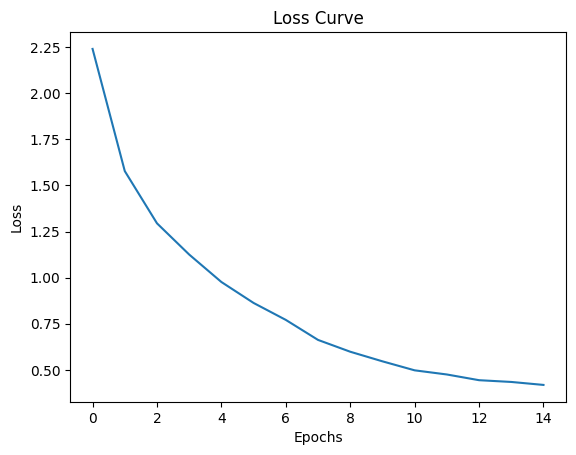

In [31]:
def plot_loss_curve(loss_curve):
    plt.plot(loss_curve)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.title('Loss Curve')
    plt.show()

device = "cuda" if torch.cuda.is_available() else "cpu"
model.to(device)
loss_curve = train_model(model, clip_dl, optimizer,scheduler,epochs=15, device=device)
plot_loss_curve(loss_curve)


### 🎯 **Task 6: The Grand Finale – Zero-Shot Classification**  

The heist is almost complete. The blueprint is drawn, the vault is cracked, and now **ProfessorCLIP** must prove its worth. In this final showdown, the model will attempt its **ultimate trick**: classifying images **without ever seeing labeled examples before.**  

This is where **Zero-Shot Classification** comes into play. Like a mastermind who instantly recognizes a disguise, **ProfessorCLIP** must compare an image against textual class descriptions and pick the most probable match **without explicit training** on the categories.  

### 🏆 Your Task:  
- Design a function to evaluate the model’s capacity for classifying unseen images.  
- Convert textual descriptions into a structured format and refine the image input.  
- Generate distinct feature representations for both text and image.  
- Establish a metric to assess the relationship between the two modalities.  
- Identify the best-aligned category and return the predicted class index.  

With this, the operation reaches its climax. If **ProfessorCLIP** succeeds, it will **outsmart conventional classifiers**, proving that true intelligence needs no labeled examples. **One image. One set of descriptions. One chance.**  

This is the moment of truth. 🃏🔥  


In [34]:
def classify(clip_model: nn.Module,
             tokenizer: Callable[[List[str]], Dict[str, torch.Tensor]],
             img: Image.Image,
             class_descriptions: List[str],
             transform: Optional[Callable[[Image.Image], torch.Tensor]] = None,
             device: str = "cuda") -> int:
    """
    Perform zero-shot classification using ProfessorCLIP.

    :param clip_model: The ProfessorCLIP model.
    :param tokenizer: Tokenizer function for text.
    :param img: A single PIL image.
    :param class_descriptions: List of textual class descriptions.
    :param transform: Image preprocessing function.
    :param device: "cuda" or "cpu".
    :return: Index of the predicted class.
    """
    clip_model.eval()


    if transform:
        img = transform(img).unsqueeze(0).to(device)  # Add batch dimension and move to device
    text_inputs = tokenizer(class_descriptions, padding=True, truncation=True, return_tensors="pt")
    text_inputs = {key: value.to(device) for key, value in text_inputs.items()}  # Move to device
    with torch.no_grad():
        image_embeddings, text_embeddings = clip_model({"image": img, "input_ids": text_inputs["input_ids"], "attention_mask": text_inputs["attention_mask"]})
        
    similarities = torch.matmul(image_embeddings, text_embeddings.T)  # Cosine similarity matrix
    predicted_class_idx = similarities.argmax().item()  # Get the highest similarity index

    return predicted_class_idx


### ⚡ **Task 7: Face the Ultimate Test** ⚡  

The machine has spoken. It is time to prove your model’s worth.  

🔹 **Summon the unseen dataset**—a true measure of its learning. This has been provided to you.
🔹 **Feed it to the model** - let it decipher patterns never encountered before.  
🔹 **Gauge its accuracy** - does it stand tall or falter in uncertainty?  

This is the moment of reckoning. Load the test dataset. Let the evaluation begin.  

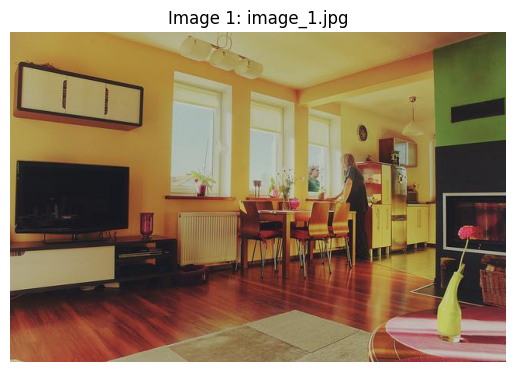

Predicted: a living room, Actual: a living room


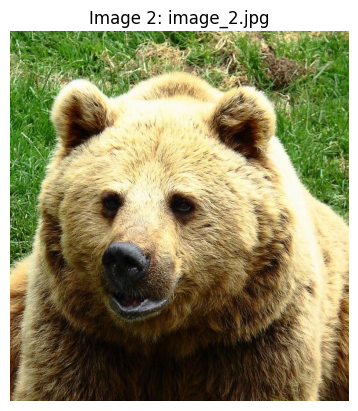

Predicted: a bear, Actual: a bear


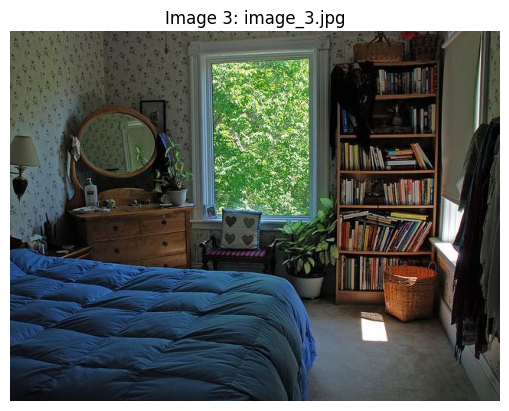

Predicted: a bedroom, Actual: a bedroom


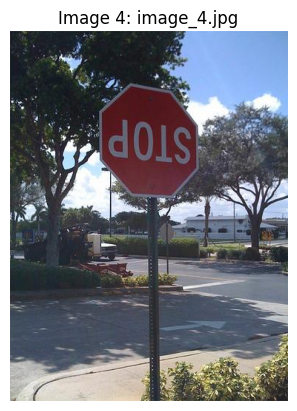

Predicted: a stop sign, Actual: a stop sign


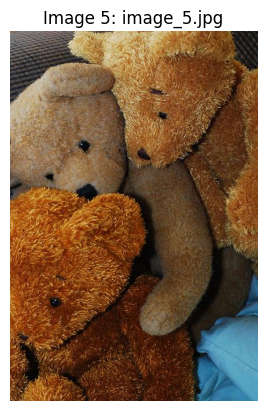

Predicted: food on a table, Actual: teddy bears


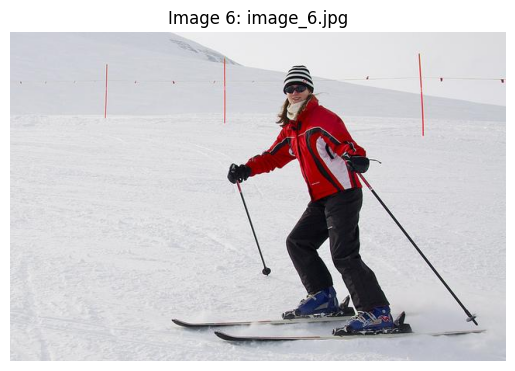

Predicted: woman on ski, Actual: woman on ski


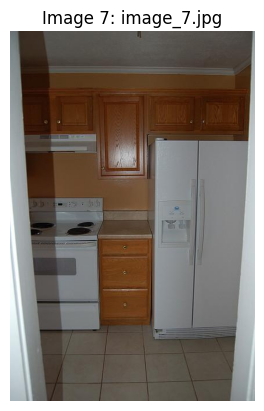

Predicted: a kitchen, Actual: a kitchen


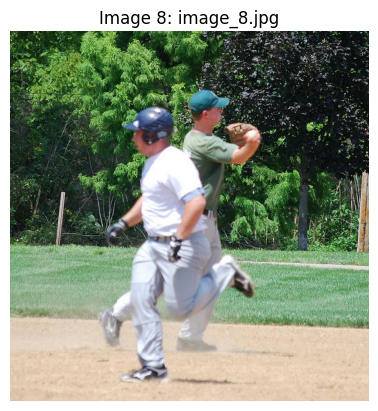

Predicted: baseball players, Actual: baseball players


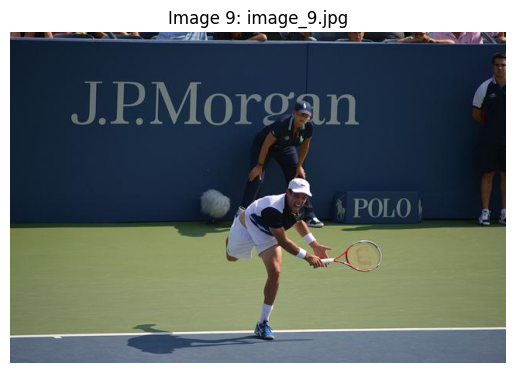

Predicted: tennis player, Actual: tennis player


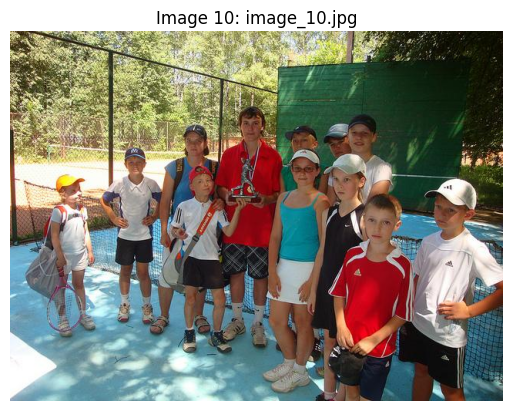

Predicted: children playing sports, Actual: children playing sports


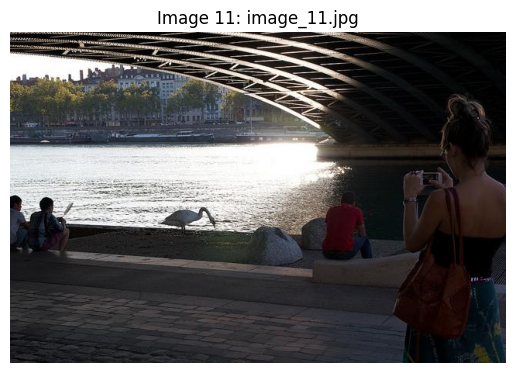

Predicted: a riverside, Actual: a riverside


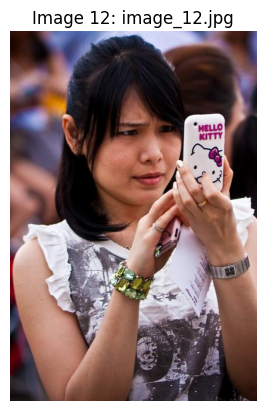

Predicted: woman holding a phone, Actual: woman holding a phone


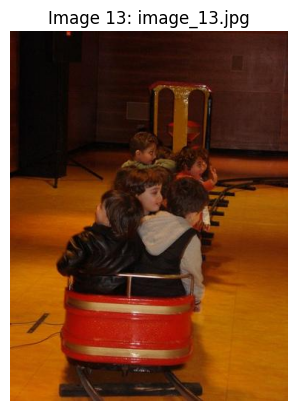

Predicted: kids in a train, Actual: kids in a train


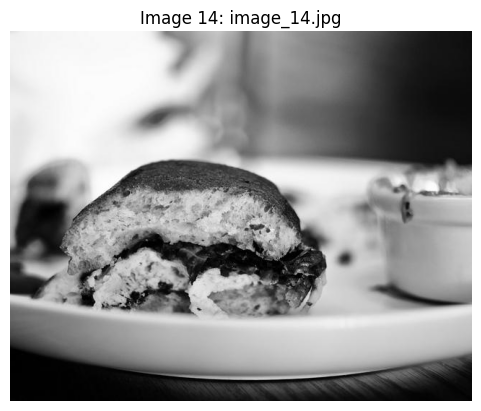

Predicted: a hamburger, Actual: a hamburger


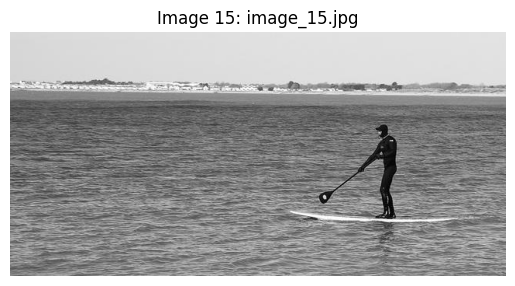

Predicted: a man on a boat, Actual: a man on a boat


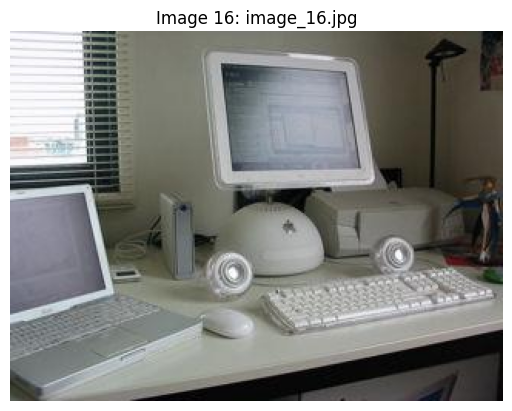

Predicted: a desktop computer, Actual: a desktop computer


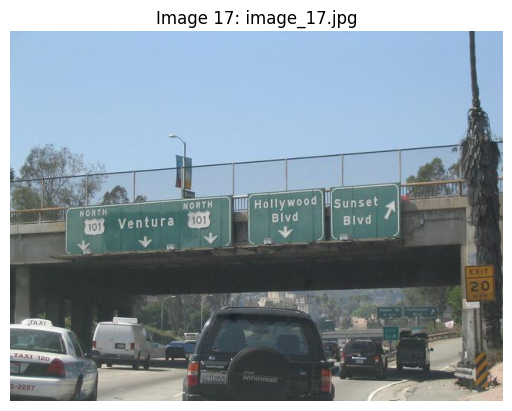

Predicted: highway sign board, Actual: highway sign board


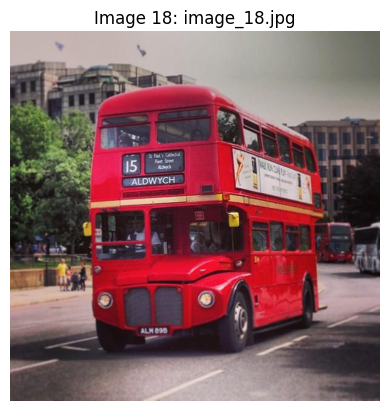

Predicted: double decker bus, Actual: double decker bus


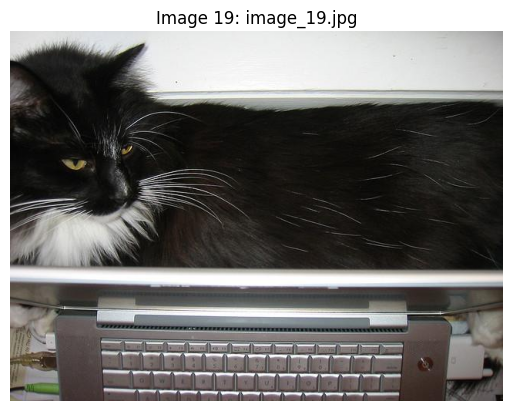

Predicted: cat above laptop, Actual: cat above laptop


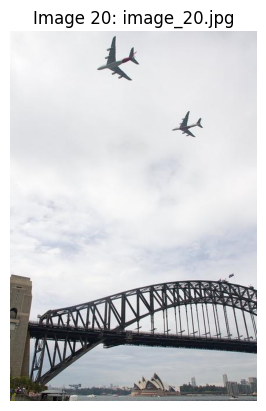

Predicted: aeroplanes over a bridge, Actual: aeroplanes over a bridge


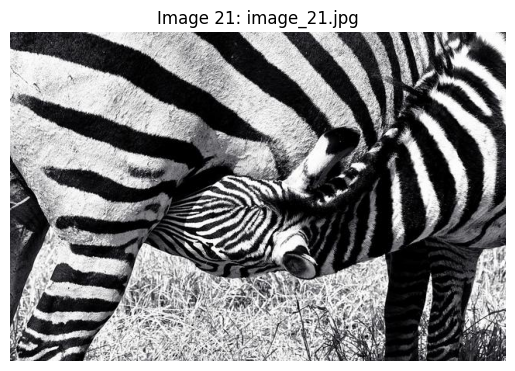

Predicted: a zebra body, Actual: a zebra body


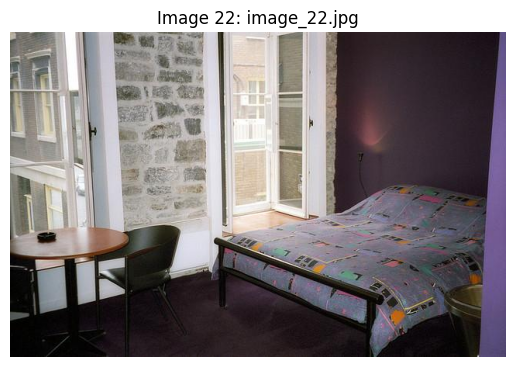

Predicted: a bedroom, Actual: a bedroom


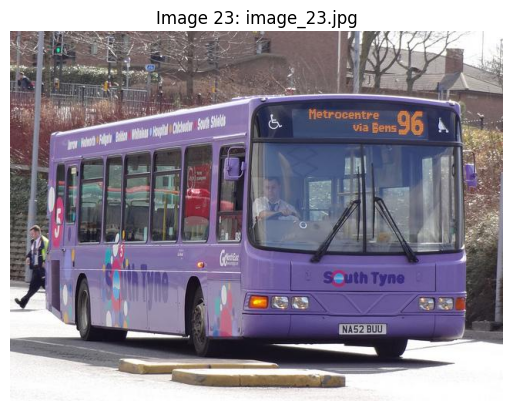

Predicted: a bus, Actual: a bus


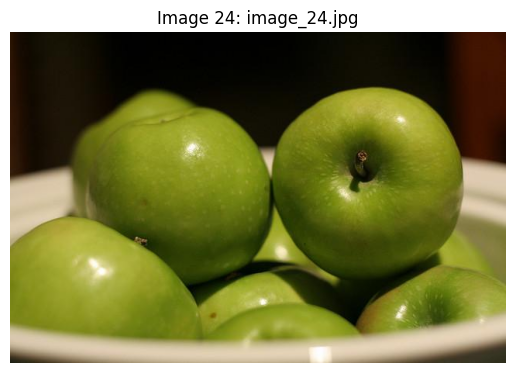

Predicted: green apples, Actual: green apples


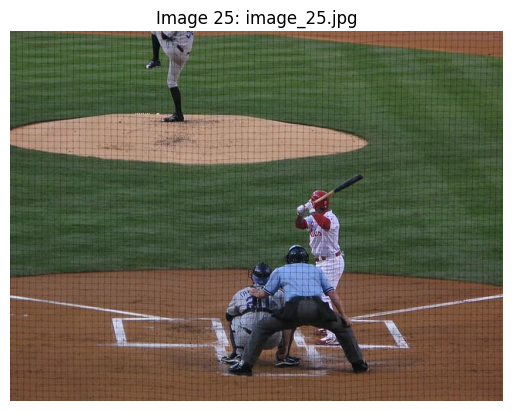

Predicted: a baseball match, Actual: a baseball match


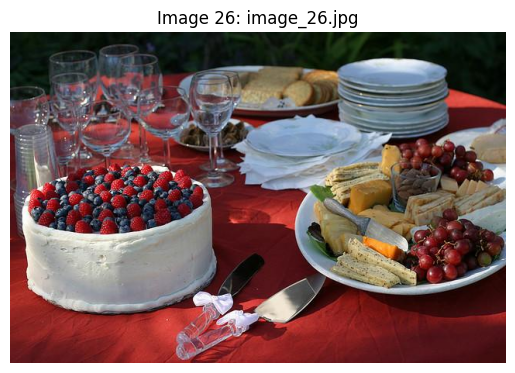

Predicted: food on a table, Actual: food on a table


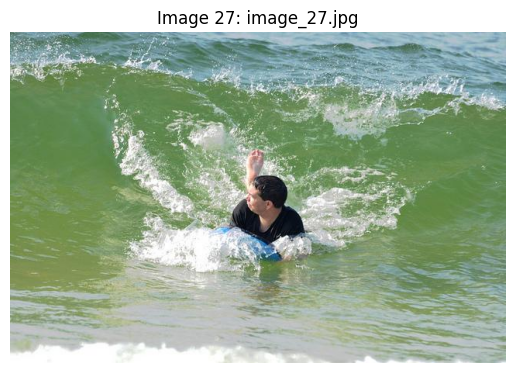

Predicted: man swimming, Actual: man swimming


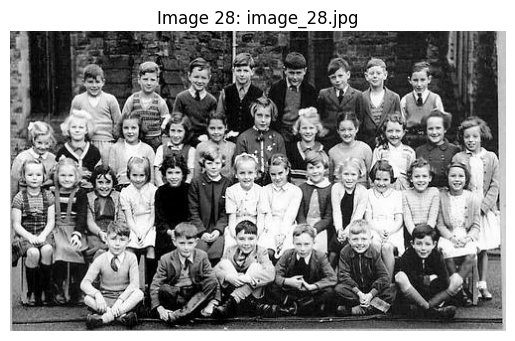

Predicted: a group picture of students, Actual: a group picture of students


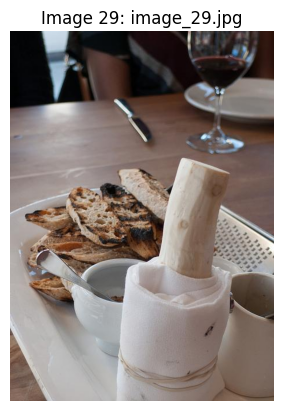

Predicted: a main course dish, Actual: a main course dish


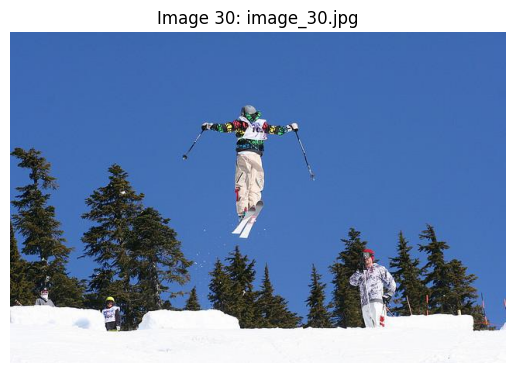

Predicted: a man jumping, Actual: a man jumping


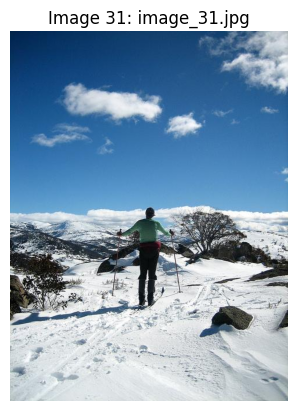

Predicted: woman on ski, Actual: a man in the snow


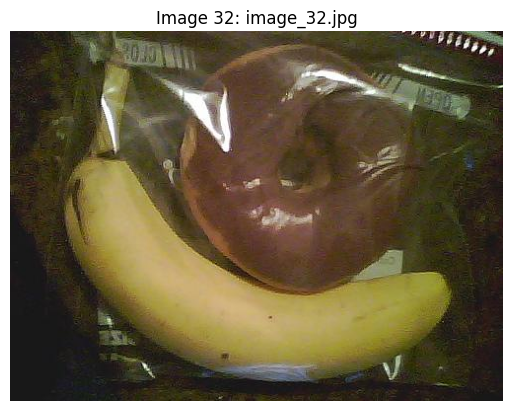

Predicted: a hamburger, Actual: snack


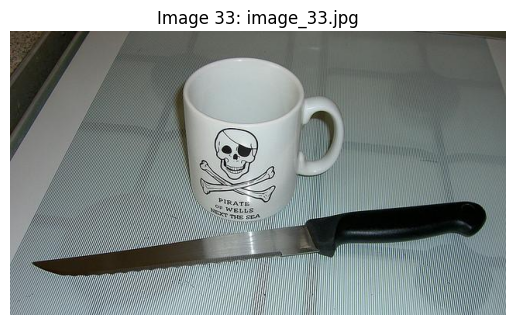

Predicted: highway sign board, Actual: kitchen utensils


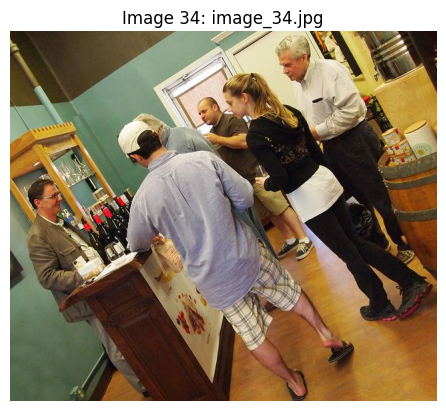

Predicted: people in a bakery, Actual: people in a bakery


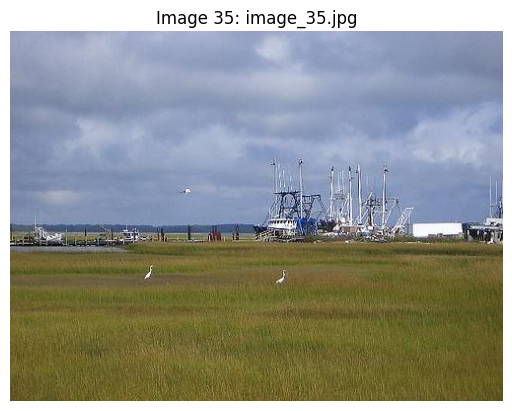

Predicted: a field, Actual: a field


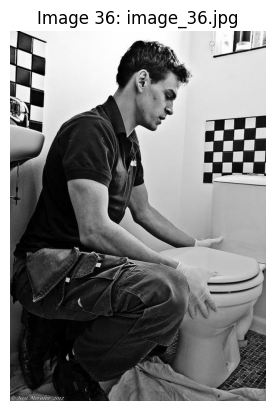

Predicted: man in the toilet, Actual: man in the toilet


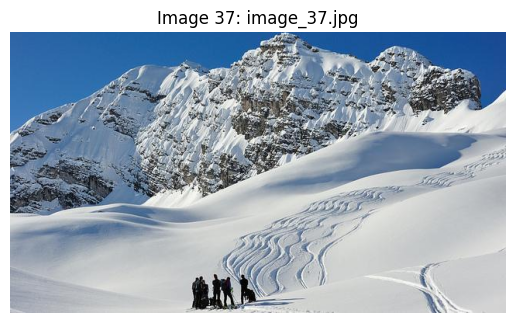

Predicted: snow capped mountain, Actual: snow capped mountain


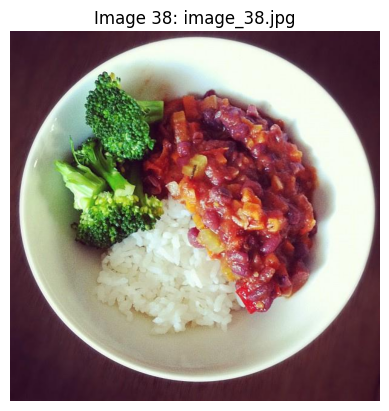

Predicted: man on skateboard, Actual: salad bowl


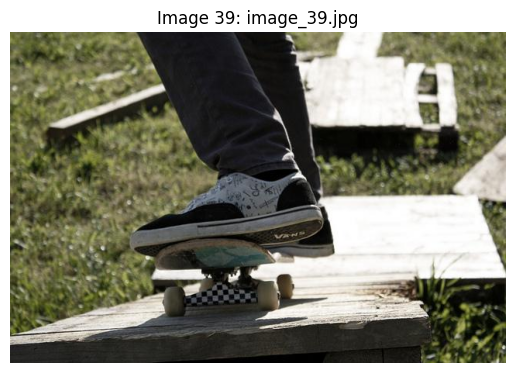

Predicted: man on skateboard, Actual: man on skateboard


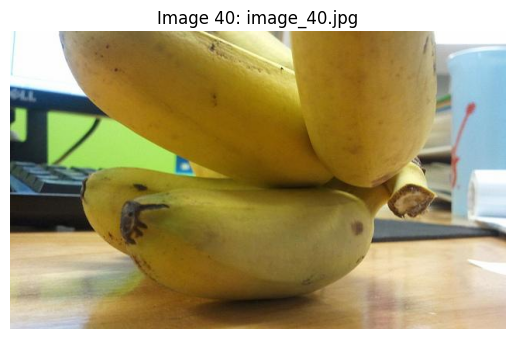

Predicted: a supermarket, Actual: bunch of bananas


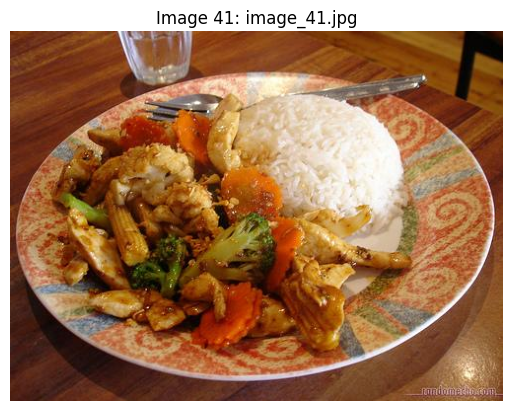

Predicted: lunch plate, Actual: lunch plate


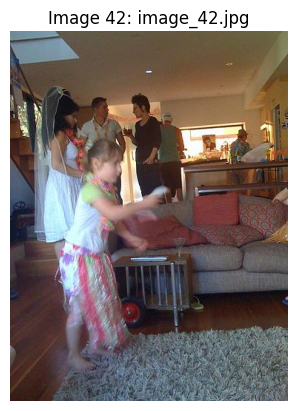

Predicted: people in a room, Actual: people in a room


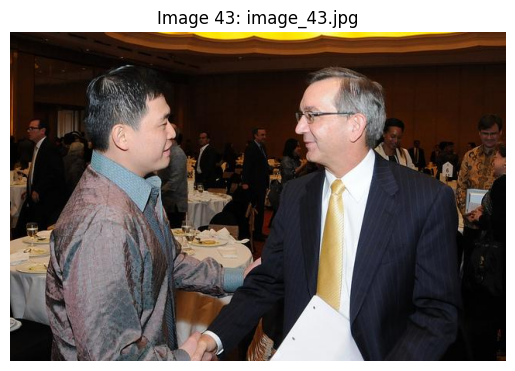

Predicted: men shaking hands, Actual: men shaking hands


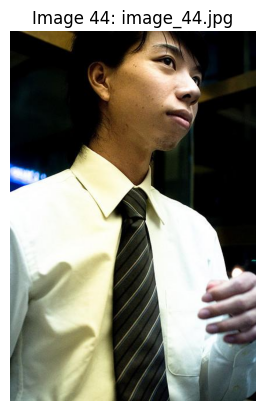

Predicted: man in a tie, Actual: man in a tie


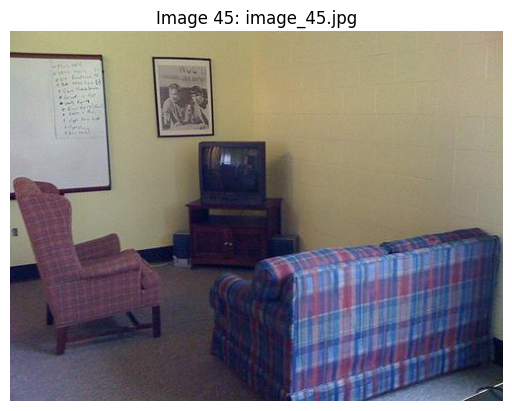

Predicted: living room, Actual: living room


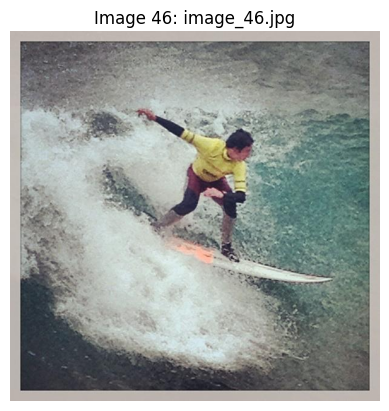

Predicted: surfboarding, Actual: surfboarding


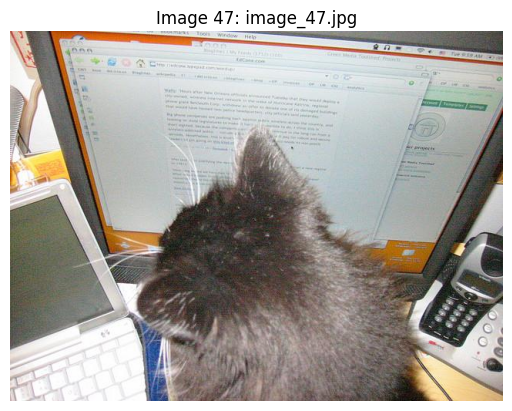

Predicted: cat on desk, Actual: cat on desk


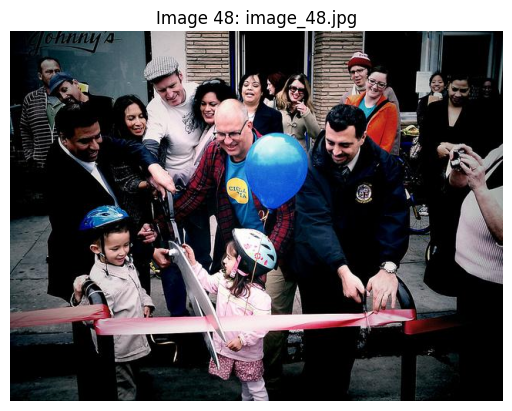

Predicted: birthday celebration, Actual: birthday celebration


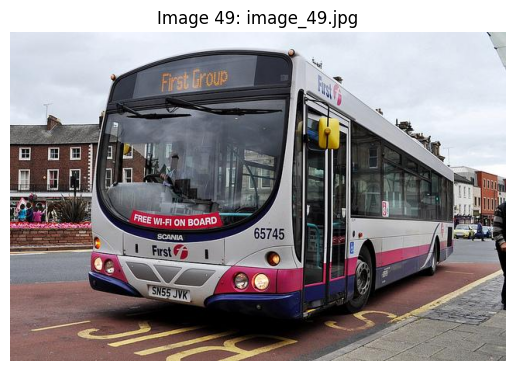

Predicted: local bus, Actual: local bus


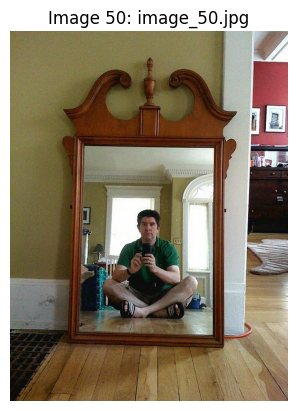

Predicted: mirror selfie, Actual: mirror selfie


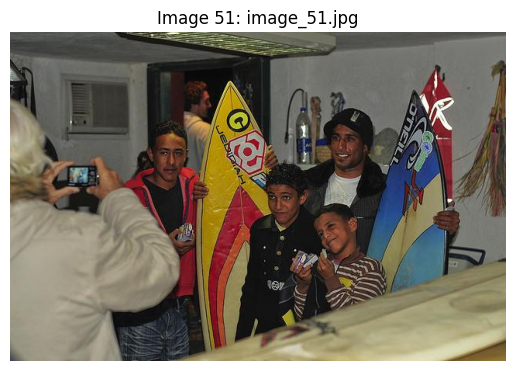

Predicted: men in a shop, Actual: men in a shop


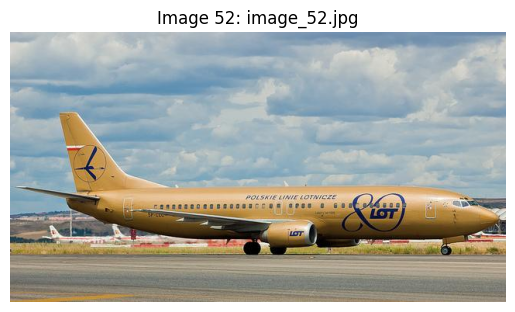

Predicted: an aeroplane, Actual: an aeroplane


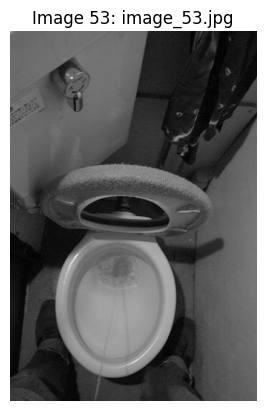

Predicted: a hotel bathroom, Actual: a commode


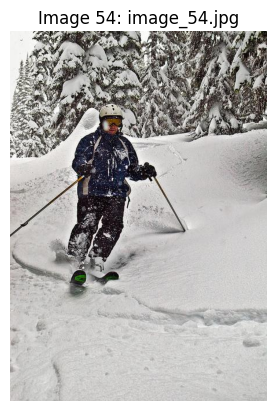

Predicted: a ski diver, Actual: a ski diver


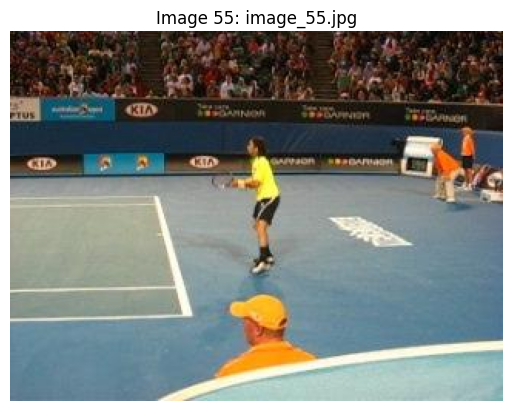

Predicted: a tennis player, Actual: a tennis player


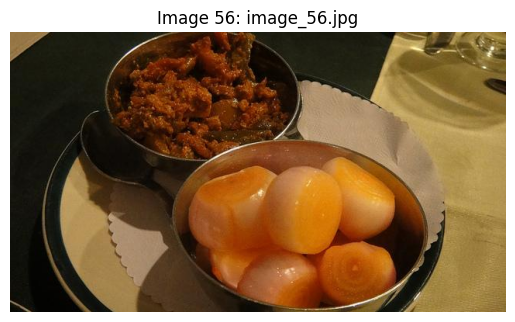

Predicted: a plate of food, Actual: a plate of food


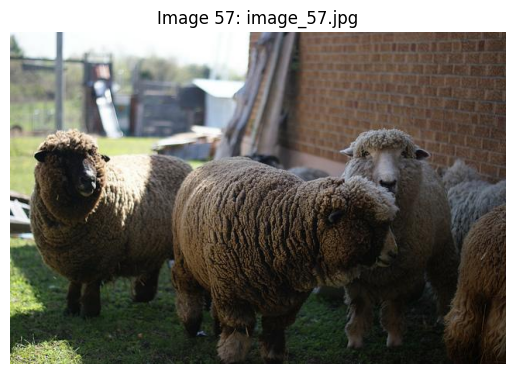

Predicted: a few sheep, Actual: a few sheep


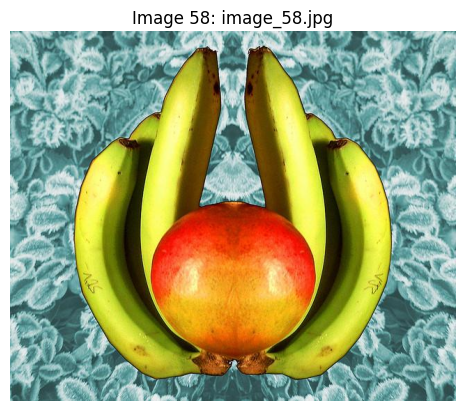

Predicted: a few fruits, Actual: a few fruits


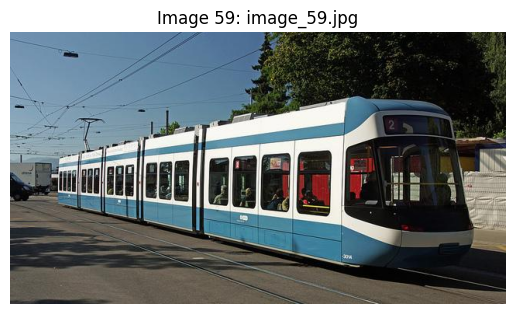

Predicted: a tram, Actual: a tram


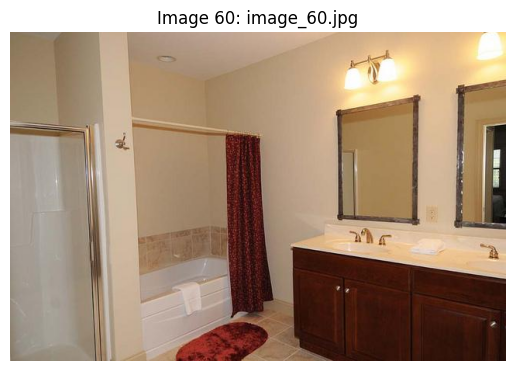

Predicted: a hotel bathroom, Actual: a hotel bathroom
Accuracy: 88.33%


In [37]:
device = "cuda" if torch.cuda.is_available() else "cpu"


transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Standard size for CLIP
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])
])

directory_path = '/kaggle/input/test-images/test_images/'  # Adjusted path
json_path = '/kaggle/input/captions/captions.json'

if not os.path.exists(directory_path):
    raise FileNotFoundError(f"Directory '{directory_path}' does not exist.")
if not os.path.exists(json_path):
    raise FileNotFoundError(f"JSON file '{json_path}' does not exist.")
with open(json_path, "r") as f:
    json_data = json.load(f)

image_filenames = sorted(os.listdir(directory_path))

def sorted_numerically(filenames):
    return sorted(filenames, key=lambda x: int(x.split('_')[-1].split('.')[0]))  # Extracting numeric part

image_filenames = sorted_numerically(image_filenames)

correct_predictions = 0
total_images = 0

for idx, filename in enumerate(image_filenames):
    image_path = os.path.join(directory_path, filename)

    img = Image.open(image_path).convert("RGB")
    if idx >= len(json_data):
        print(f"Skipping image {filename} as it exceeds JSON entries.")
        continue
    labels = json_data[idx]["labels"]
    actual_index = json_data[idx]["index"]
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Image {idx+1}: {filename}")
    plt.show()
    predicted_index = classify(model, tokenizer, img, labels, transform=transform, device=device)

    print(f"Predicted: {labels[predicted_index]}, Actual: {labels[actual_index]}")

    if predicted_index == actual_index:
        correct_predictions += 1
    total_images += 1

accuracy = (correct_predictions / total_images) * 100 if total_images > 0 else 0
print(f"Accuracy: {accuracy:.2f}%")

### 🎯 **The Final Verdict: Victory or Defeat?** 🎯  

The time has come to judge your model’s strength. Will it rise to glory or crumble under scrutiny?  

🔹 **Compute the accuracy**—every correct prediction counts.  
🔹 **Compare it to the threshold**—the ultimate challenge.  
🔹 **Decide your fate**—did you conquer, or did the machine defeat you?  

Let the final test begin!  


In [38]:
print(f"Accuracy: {accuracy:.2f}%")

if accuracy >= 85:
        print("🏆 Victory! The machine bows before you. 🏆")
        
else:
    print("💀 Defeat! The machine remains undefeated. 💀")

Accuracy: 88.33%
🏆 Victory! The machine bows before you. 🏆
